## Imports

In [ ]:
!pip install nltk==3.4

     |████████████████████████████████| 1.4 MB 24.2 MB/s 
  Created wheel for nltk: filename=nltk-3.4-py3-none-any.whl size=1436397 sha256=b50fd646341675dc9f1b56bfdb7b85bd008721996119ccc8a0047578b7c31d50
  Stored in directory: /root/.cache/pip/wheels/13/b8/81/2349be11dd144dc7b68ab983b58cd2fae353cdc50bbdeb09d0
Successfully built nltk
  Attempting uninstall: nltk
    Found existing installation: nltk 3.2.5
    Uninstalling nltk-3.2.5:
      Successfully uninstalled nltk-3.2.5


In [ ]:
import pandas as pd 
import numpy as np
import nltk.data
import logging
import re


import shlex
import nltk
import gensim
%matplotlib inline

nltk.download('punkt')
import multiprocessing
nltk.download('wordnet')
nltk.download('stopwords')
from wordcloud import WordCloud
from gensim.models import word2vec
from sklearn.manifold import TSNE


import matplotlib.pyplot as plt
from textblob import Word
import _pickle as cPickle
from nltk.corpus import stopwords
from gensim.models import Word2Vec

import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


# Important Functions

In [ ]:
def preprocess_CSVs_ML(dataframe):

  dataframe['grad'] = dataframe.astype(str).applymap(lambda x: 'Grad' in x).any(1)
  dataframe['intern'] = dataframe.astype(str).applymap(lambda x: 'Intern' in x).any(1)
  dataframe['internship'] = dataframe.astype(str).applymap(lambda x: 'Internship' in x).any(1)
  dataframe['entry'] = dataframe.astype(str).applymap(lambda x: 'Entry' in x).any(1)
  dataframe['junior'] = dataframe.astype(str).applymap(lambda x: 'Junior' in x).any(1)
  dataframe['jr.'] = dataframe.astype(str).applymap(lambda x: 'Jr.' in x).any(1)
  dataframe['senior'] = dataframe.astype(str).applymap(lambda x: 'Senior' in x).any(1)
  dataframe['sr.'] = dataframe.astype(str).applymap(lambda x: 'Sr.' in x).any(1)
  dataframe['placement'] = dataframe.astype(str).applymap(lambda x: 'Placement' in x).any(1)
  dataframe['student'] = dataframe.astype(str).applymap(lambda x: 'Student' in x).any(1)


  dataframe['Seniority Level']=''
  dataframe.loc[dataframe['grad'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['intern'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['entry'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['junior'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['jr.'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['senior'] == True, 'Seniority Level'] = 'Senior'
  dataframe.loc[dataframe['sr.'] == True, 'Seniority Level'] = 'Senior'
  dataframe.loc[dataframe['placement'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['student'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['internship'] == True, 'Seniority Level'] = 'Entry'


  #soft_uk_df = soft_uk_df.drop(soft_uk_df.index[0]) # Removing the first row 
  dataframe['Seniority Level'] =  dataframe['Seniority Level'].replace(r'^\s*$', 'Mid', regex=True) 
  dataframe["company_offeredRole"] = "Machine Learning Engineer" # Changing the role to MLE | SDE | DS 

In [ ]:
def preprocess_CSVs_SDE(dataframe):

  dataframe['grad'] = dataframe.astype(str).applymap(lambda x: 'Grad' in x).any(1)
  dataframe['intern'] = dataframe.astype(str).applymap(lambda x: 'Intern' in x).any(1)
  dataframe['internship'] = dataframe.astype(str).applymap(lambda x: 'Internship' in x).any(1)
  dataframe['entry'] = dataframe.astype(str).applymap(lambda x: 'Entry' in x).any(1)
  dataframe['junior'] = dataframe.astype(str).applymap(lambda x: 'Junior' in x).any(1)
  dataframe['jr.'] = dataframe.astype(str).applymap(lambda x: 'Jr.' in x).any(1)
  dataframe['senior'] = dataframe.astype(str).applymap(lambda x: 'Senior' in x).any(1)
  dataframe['sr.'] = dataframe.astype(str).applymap(lambda x: 'Sr.' in x).any(1)
  dataframe['placement'] = dataframe.astype(str).applymap(lambda x: 'Placement' in x).any(1)
  dataframe['student'] = dataframe.astype(str).applymap(lambda x: 'Student' in x).any(1)


  dataframe['Seniority Level']=''
  dataframe.loc[dataframe['grad'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['intern'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['entry'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['junior'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['jr.'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['senior'] == True, 'Seniority Level'] = 'Senior'
  dataframe.loc[dataframe['sr.'] == True, 'Seniority Level'] = 'Senior'
  dataframe.loc[dataframe['placement'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['student'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['internship'] == True, 'Seniority Level'] = 'Entry'


  #soft_uk_df = soft_uk_df.drop(soft_uk_df.index[0]) # Removing the first row 
  dataframe['Seniority Level'] =  dataframe['Seniority Level'].replace(r'^\s*$', 'Mid', regex=True) 
  dataframe["company_offeredRole"] = "Software Engineer" # Changing the role to MLE | SDE | DS 

In [ ]:
def preprocess_CSVs_DS(dataframe):

  dataframe['grad'] = dataframe.astype(str).applymap(lambda x: 'Grad' in x).any(1)
  dataframe['intern'] = dataframe.astype(str).applymap(lambda x: 'Intern' in x).any(1)
  dataframe['internship'] = dataframe.astype(str).applymap(lambda x: 'Internship' in x).any(1)
  dataframe['entry'] = dataframe.astype(str).applymap(lambda x: 'Entry' in x).any(1)
  dataframe['junior'] = dataframe.astype(str).applymap(lambda x: 'Junior' in x).any(1)
  dataframe['jr.'] = dataframe.astype(str).applymap(lambda x: 'Jr.' in x).any(1)
  dataframe['senior'] = dataframe.astype(str).applymap(lambda x: 'Senior' in x).any(1)
  dataframe['sr.'] = dataframe.astype(str).applymap(lambda x: 'Sr.' in x).any(1)
  dataframe['placement'] = dataframe.astype(str).applymap(lambda x: 'Placement' in x).any(1)
  dataframe['student'] = dataframe.astype(str).applymap(lambda x: 'Student' in x).any(1)


  dataframe['Seniority Level']=''
  dataframe.loc[dataframe['grad'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['intern'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['entry'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['junior'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['jr.'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['senior'] == True, 'Seniority Level'] = 'Senior'
  dataframe.loc[dataframe['sr.'] == True, 'Seniority Level'] = 'Senior'
  dataframe.loc[dataframe['placement'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['student'] == True, 'Seniority Level'] = 'Entry'
  dataframe.loc[dataframe['internship'] == True, 'Seniority Level'] = 'Entry'


  #soft_uk_df = soft_uk_df.drop(soft_uk_df.index[0]) # Removing the first row 
  dataframe['Seniority Level'] =  dataframe['Seniority Level'].replace(r'^\s*$', 'Mid', regex=True) 
  dataframe["company_offeredRole"] = "Data Science" # Changing the role to MLE | SDE | DS 

# Reading CSVs & Proceessing 

### Machine Learning 

In [ ]:
# Reading ML Dataframes
df_1 = pd.read_excel("/content/sample_data/MLE/ML_I_uk.xlsx")
df_2 = pd.read_excel("/content/sample_data/MLE/ML_I_us.xlsx")
df_3 = pd.read_excel("/content/sample_data/MLE/ML_uk.xlsx")
df_4 = pd.read_excel("/content/sample_data/MLE/ML_us.xlsx")

#Concatenating all ML Roles 
final_ML_csv = pd.concat([df_1, df_2, df_3, df_4], axis = 0)

#Removing Unnamed column 
final_ML_csv = final_ML_csv.loc[:, ~final_ML_csv.columns.str.contains('^Unnamed: 0')]

#Preprocess function       
preprocess_CSVs_ML(final_ML_csv)

#Dropping duplictaes
final_ML_csv = final_ML_csv.drop_duplicates() 

# Dropping columns 
final_ML_csv = final_ML_csv.drop(columns=['grad','entry', 'junior', 'jr.', 'senior', 'sr.', 'requested_url', 'company_starRating','intern', 'placement', 'student', 'internship', 'company_roleLocation'])

# printing shapes
print(final_ML_csv.shape)
print("."*200)
#Reset Index
final_ML_csv = final_ML_csv.reset_index(drop=True)
# saving csv as Pre_processed_ML_all_jobs_desc.csv
final_ML_csv.to_csv("Pre_processed_ML_all_jobs_desc.csv")
# display dataframe
final_ML_csv

(2820, 4)
........................................................................................................................................................................................................


,companyName,company_offeredRole,listing_jobDesc,Seniority Level
0,Amazon Dev Centre (London) Ltd,Machine Learning Engineer,Experience with data scripting languages (e.g....,Entry
1,TikTok,Machine Learning Engineer,Building industry-leading trust and safety sys...,Entry
2,Facebook,Machine Learning Engineer,Develop highly scalable classifiers and tools ...,Entry
3,TikTok,Machine Learning Engineer,Work with our world-class engineers to build i...,Entry
4,DataSpartan Consulting,Machine Learning Engineer,Work closely with Data Engineers and Data Scie...,Mid
...,...,...,...,...
2815,"University of Pennsylvania, Department of Radi...",Machine Learning Engineer,Dental insurance Employee assistance program E...,Mid
2816,EpochGeo,Machine Learning Engineer,3 - 8+ years of experience working in data ana...,Mid
2817,Mayo Clinic,Machine Learning Engineer,.css-1yuy9gt{display:-webkit-box;-webkit-line-...,Mid
2818,"Prenosis, Inc.",Machine Learning Engineer,Design and implement machine learning pipeline...,Mid


### Software Engineer

In [ ]:
# Reading ML Dataframes
df_1 = pd.read_excel("/content/sample_data/SDE/SDE_I_uk.xlsx")
df_2 = pd.read_excel("/content/sample_data/SDE/SDE_I_us.xlsx")
df_3 = pd.read_excel("/content/sample_data/SDE/SDE_Sr_uk.xlsx")
df_4 = pd.read_excel("/content/sample_data/SDE/SDE_Sr_us.xlsx")
df_5 = pd.read_excel("/content/sample_data/SDE/SDE_uk.xlsx")
df_6 = pd.read_excel("/content/sample_data/SDE/SDE_us.xlsx")

#Concatenating all SDE Roles  
final_SDE_csv = pd.concat([df_1, df_2, df_3, df_4, df_5, df_6], axis = 0)

#Removing Unnamed column 
final_SDE_csv = final_SDE_csv.loc[:, ~final_SDE_csv.columns.str.contains('^Unnamed: 0')]

#Preprocess function       
preprocess_CSVs_SDE(final_SDE_csv)

#Dropping duplictaes
final_SDE_csv = final_SDE_csv.drop_duplicates()  

# Dropping columns 
final_SDE_csv = final_SDE_csv.drop(columns=['grad','entry', 'junior', 'jr.', 'senior', 'sr.', 'requested_url', 'company_starRating','intern', 'placement', 'student', 'internship', 'company_roleLocation'])

# printing shapes
print(final_SDE_csv.shape)
print("."*200)
#Reset Index
final_SDE_csv = final_SDE_csv.reset_index(drop=True)
# saving csv as Pre_processed_SDE_all_jobs_desc.csv
final_SDE_csv.to_csv("Pre_processed_SDE_all_jobs_desc.csv")
# display dataframe
final_SDE_csv

(4600, 4)
........................................................................................................................................................................................................


,companyName,company_offeredRole,listing_jobDesc,Seniority Level
0,Amazon Data Services UK Ltd,Software Engineer,Currently enrolled in a Bachelor’s or Master’s...,Entry
1,Applied Nanodetectors Ltd,Software Engineer,Intermediate skills in python and C++ Backgrou...,Mid
2,Jane Street,Software Engineer,A top-notch programmer with a passion for tech...,Entry
3,CITADEL ENTERPRISE EUROPE LIMITED,Software Engineer,Create technological tools that bring trading ...,Entry
4,Microsoft,Software Engineer,\nMade new Player Items. \nAdded new AI Abilit...,Entry
...,...,...,...,...
4595,Bellwood Labs,Software Engineer,401(k) Dental insurance Flexible schedule Heal...,Mid
4596,"Yardi Systems, Inc.",Software Engineer,"Modify, implement, and maintain existing appli...",Mid
4597,Krisp Inc.,Software Engineer,Flexible schedule Paid time off Parental leave...,Mid
4598,RDI Tech Partners,Software Engineer,"Build, scale and maintain our client applicati...",Mid


### Data Science

In [ ]:
# Reading ML Dataframes
df_1 = pd.read_excel("/content/sample_data/DS/DS_I_uk.xlsx")
df_2 = pd.read_excel("/content/sample_data/DS/DS_I_us_.xlsx")
df_3 = pd.read_excel("/content/sample_data/DS/DS_Sr_uk.xlsx")
df_4 = pd.read_excel("/content/sample_data/DS/DS_Sr_us.xlsx")
df_5 = pd.read_excel("/content/sample_data/DS/DS_uk.xlsx")
df_6 = pd.read_excel("/content/sample_data/DS/DS_us.xlsx")

#Concatenating all DS Roles 
final_DS_csv = pd.concat([df_1, df_2, df_3, df_4, df_5, df_6], axis = 0)

#Removing Unnamed column 
final_DS_csv = final_DS_csv.loc[:, ~final_DS_csv.columns.str.contains('^Unnamed: 0')] 

#Preprocess function       
preprocess_CSVs_DS(final_DS_csv)

#Dropping duplictaes
final_DS_csv = final_DS_csv.drop_duplicates() 

# Dropping columns 
final_DS_csv = final_DS_csv.drop(columns=['grad','entry', 'junior', 'jr.', 'senior', 'sr.', 'requested_url', 'company_starRating','intern', 'placement', 'student', 'internship', 'company_roleLocation'])

# printing shapes
print(final_DS_csv.shape)
print("."*200)
#Reset Index
final_DS_csv = final_DS_csv.reset_index(drop=True)
# saving csv as Pre_processed_ML_all_jobs_desc.csv
final_DS_csv.to_csv("Pre_processed_DS_all_jobs_desc.csv")
# display dataframe
final_DS_csv

(4009, 4)
........................................................................................................................................................................................................


,companyName,company_offeredRole,listing_jobDesc,Seniority Level
0,Facebook,Data Science,"Build pragmatic, scalable, and statistically r...",Entry
1,atai,Data Science,A fast-paced environment where you'll work on ...,Entry
2,Sky,Data Science,"Studying towards BSc, MSc, PhD in Computer Sci...",Entry
3,"JPMorgan Chase Bank, N.A.",Data Science,Pursuing a Bachelor's or 1-Year Master's* degr...,Entry
4,Kindeva Drug Delivery Careers,Data Science,Become an active member of the Data and Docume...,Entry
...,...,...,...,...
4004,MetLife Legal Plans,Data Science,Demonstrated professional experience in Tablea...,Mid
4005,Dow Jones,Data Science,Create audience development strategy guideline...,Mid
4006,Confidential,Data Science,1000% Remote Opportunity Room for advancement ...,Mid
4007,Charles Schwab,Data Science,\nMost Schwabbies have the opportunity to volu...,Mid


### Concatenating the 3 dataframes

In [ ]:
#Concatenate DF
final_SDE_DS_MLE_Name_role_desc_level = pd.concat([final_SDE_csv, final_ML_csv, final_DS_csv])

#Printing the shape
print("Shape: ", final_SDE_DS_MLE_Name_role_desc_level.shape)

#Reset Index
final_SDE_DS_MLE_Name_role_desc_level = final_SDE_DS_MLE_Name_role_desc_level.reset_index(drop=True)

#Saving the final concatenated dataframe
final_SDE_DS_MLE_Name_role_desc_level.to_excel("Final_SDE_DS_MLE_Name_role_desc_level.xlsx")
#Display dataframe
final_SDE_DS_MLE_Name_role_desc_level

Shape:  (11429, 4)


,companyName,company_offeredRole,listing_jobDesc,Seniority Level
0,Amazon Data Services UK Ltd,Software Engineer,Currently enrolled in a Bachelor’s or Master’s...,Entry
1,Applied Nanodetectors Ltd,Software Engineer,Intermediate skills in python and C++ Backgrou...,Mid
2,Jane Street,Software Engineer,A top-notch programmer with a passion for tech...,Entry
3,CITADEL ENTERPRISE EUROPE LIMITED,Software Engineer,Create technological tools that bring trading ...,Entry
4,Microsoft,Software Engineer,\nMade new Player Items. \nAdded new AI Abilit...,Entry
...,...,...,...,...
11424,MetLife Legal Plans,Data Science,Demonstrated professional experience in Tablea...,Mid
11425,Dow Jones,Data Science,Create audience development strategy guideline...,Mid
11426,Confidential,Data Science,1000% Remote Opportunity Room for advancement ...,Mid
11427,Charles Schwab,Data Science,\nMost Schwabbies have the opportunity to volu...,Mid


# Skill Extraction

## Preprocessing

In [ ]:
## Lower case
final_SDE_DS_MLE_Name_role_desc_level["listing_jobDesc"] = final_SDE_DS_MLE_Name_role_desc_level["listing_jobDesc"].str.lower()

#Printing shape before dropping null values 
print("Shape before dropping null values:" , final_SDE_DS_MLE_Name_role_desc_level.shape)

#Drop null values
final_SDE_DS_MLE_Name_role_desc_level = final_SDE_DS_MLE_Name_role_desc_level.dropna()
#Reset Index
final_SDE_DS_MLE_Name_role_desc_level = final_SDE_DS_MLE_Name_role_desc_level.reset_index(drop=True)

#Printing shape after dropping null values 
print("Shape before dropping null values:" , final_SDE_DS_MLE_Name_role_desc_level.shape)

#Creating a new column "Skill Required" to save all the skills.
final_SDE_DS_MLE_Name_role_desc_level["skills_required"] = ""

#Display dataframe
final_SDE_DS_MLE_Name_role_desc_level

Shape before dropping null values: (11429, 4)
Shape before dropping null values: (11426, 4)


,companyName,company_offeredRole,listing_jobDesc,Seniority Level,skills_required
0,Amazon Data Services UK Ltd,Software Engineer,currently enrolled in a bachelor’s or master’s...,Entry,
1,Applied Nanodetectors Ltd,Software Engineer,intermediate skills in python and c++ backgrou...,Mid,
2,Jane Street,Software Engineer,a top-notch programmer with a passion for tech...,Entry,
3,CITADEL ENTERPRISE EUROPE LIMITED,Software Engineer,create technological tools that bring trading ...,Entry,
4,Microsoft,Software Engineer,\nmade new player items. \nadded new ai abilit...,Entry,
...,...,...,...,...,...
11421,MetLife Legal Plans,Data Science,demonstrated professional experience in tablea...,Mid,
11422,Dow Jones,Data Science,create audience development strategy guideline...,Mid,
11423,Confidential,Data Science,1000% remote opportunity room for advancement ...,Mid,
11424,Charles Schwab,Data Science,\nmost schwabbies have the opportunity to volu...,Mid,


## Imports for Keyword Extraction

In [ ]:
SKILLS_DB = ['machine learning', 'tensorflow', 'pytorch','data science','python', 'machine learning','word','excel', 'sql', 'mxnet', 'mlflow', 'einstein', 'theano', 'pyspark', 'solr', 'mahout', 
             'cassandra', 'aws', 'powerpoint', 'spark', 'pig', 'sas', 'java', 'nosql', 'caffe', 'scipy', 'numpy', 'matplotlib', 'vba', 'spss', 'linux', 'azure', 'cloud', 'gcp', 'mysql', 'oracle', 
             'docker', 'salesforce', 'scala', 'r', 'c', 'c++', '.net', 'tableau', 'pandas', 'scikitlearn', 'sklearn', 'matlab', 'scala', 'keras', 'clojure','redshift', 'snowflake', 'kafka', 'qlik', 
             'jupyter', 'perl', 'bigquery', 'unix', 'react','scikit', 'powerbi', 's3', 'ec2', 'lambda', 'ssrs', 'kubernetes', 'hana', 'spacy', 'tf', 'django', 'sagemaker','seaborn', 'mllib', 'github', 
             'git', 'elasticsearch', 'splunk', 'airflow', 'looker', 'jquery', 'nodejs', 'd3', 'plotly', 'bokeh', 'xgboost', 'rstudio', 'shiny', 'dash', 'h20', 'h2o', 'hadoop', 'mapreduce', 'hive', 
             'cognos', 'angular', 'nltk', 'flask', 'node', 'firebase', 'bigtable', 'rust', 'php', 'cntk', 'lightgbm', 'computer vision', 'deep learning', 'neural network', 'cnn', 
             'convolutional neural network', 'big data processing','kubeflow', 'rpython', 'unixlinux', 'postgressql', 'postgresql', 'postgres', 'hbase', 'dask', 'ruby', 'julia', 'tensor', 'statistics', 
             'chatbot', 'cleaning', 'blockchain', 'causality', 'correlation', 'bandit', 'anomaly', 'kpi', 'geospatial', 'ocr', 'econometrics', 'pca', 'gis', 'svm', 'svd', 'tuning', 'hyperparameter', 
             'hypothesis','salesforce', 'segmentation', 'biostatistics', 'unsupervised', 'supervised', 'exploratory', 'dynamic programming', 'algorithm', 'graph theory', 'recommendation system', 
             'research', 'sequencing', 'probability', 'reinforcement', 'graph', 'bioinformatics', 'chi', 'knn', 'outlier', 'etl', 'normalization', 'classification', 'optimizing', 'prediction', 
             'forecasting','clustering', 'cluster', 'optimization', 'visualization', 'nlp', 'c#','regression', 'logistic', 'nn', 'cnn', 'glm','rnn', 'lstm', 'gbm', 'boosting', 
             'recurrent', 'convolutional', 'bayesian','bayes', 'random forest', 'natural language processing', 'decision tree', 'experimental design','time series', 
             'nearest neighbors', 'neural network', 'support vector machine', 'machine vision', 'dimensionality reduction', 'text analytics', 'power bi', 
             'a/b testing', 'ab testing', 'chat bot', 'data mining', 'html', 'css', 'html/css', 'javascript', 'backend', 'full stack', 'mongodb', 'bachelors', 'data analysis', 
             'data visualization', 'data analytics', 'microsoft word', 'microsoft power bi', 'power bi', 'bachelor', 'undergraduate', 'master', 'graduate','phd', 'ph.d', 'ms',
             'ba', 'ma','postdoctoral', 'postdoc', 'doctorate', 'ml libraries & algorithms', 'ml libraries', 'system design', 'aws', 'computer science', 'applied mathematics', 
             'tf', '3 years', '2 years', '1 year', '5 years', '4 years', '6 years', '7 years', '10 years', 'professional', 'gcp','dl libraries', 'senior software engineer', 'senior', 
             'kotlin', 'back-end', 'andriod', 'full-time', "k-nearest neighbors", "k-means clustering", 'oop', 'ml', 'algebra', 'devops', 'dev ops', 'dev-ops', 
             'continuous integration', 'ci/cd', 'api', 'app development', 'rest', 'soa', 'data modeling', 'agile development', 'amazon web services', 'Android', 'Angular.js',
             'apache', 'cloud computing', 'cryptography', 'cuda', 'data entry', 'Data Mining', 'data processing', 'debugging', 'cs', '5+ years', '4+ years', 'c/c++'
             'javase', 'javaee', 'javame', 'j2seb', 'c#', 'objective-c', 'j2ee', 'restful', 'rest', 'object-oriented programming', 'object oriented programming', 'big data', 'big-data', 
             'bigdata', 'jira', 'ui/ux', 'user interface/experience', 'agile', 'user interface', 'web developer', 'full stack developer', 'cybersecurity', 'cyber security', 'data algorithms', 
             'perl', 'ruby on rails', 'r', 'stats', 'hdfs', 'datastructures', 'data structure', 'data structures', 'search engine optimization', 'algorithms', 'html5', 'web design', 
             'docker', 'jenkins', 'visual studio', 'vs', 'xcode', 'react.js', 'uxd', 'user experience design', 'ux', 'fullstack', 'full stack', 'full-stack', 'bootstrap',
             'html3', 'asp.net', 'post-doc', 'data modelling', 'r programming', 'eclipse', 'recommender systems', 'recommendation systems',    
             'English',
]

In [ ]:
def extract_skills(input_text):
    stop_words = set(nltk.corpus.stopwords.words('english'))
    word_tokens = nltk.tokenize.word_tokenize(input_text)

    # remove the stop words
    filtered_tokens = [w for w in word_tokens if w not in stop_words]

    # remove the punctuation
    filtered_tokens = [w for w in word_tokens if w.isalpha()]

    # generate bigrams and trigrams (such as artificial intelligence)
    bigrams_trigrams = list(map(' '.join, nltk.everygrams(filtered_tokens, 2, 3)))

    # we create a set to keep the results in.
    found_skills = set()

    # we search for each token in our skills database
    for token in filtered_tokens:
        if token.lower() in SKILLS_DB:
            found_skills.add(token)

    # we search for each bigram and trigram in our skills database
    for ngram in bigrams_trigrams:
        if ngram.lower() in SKILLS_DB:
            found_skills.add(ngram)

    return found_skills

#Function to extract skills from descp 
def select_description_col(dataframe, column):
  for index, descp in enumerate(dataframe[column]):
    descp = dataframe[column][index]
    keywords = list(extract_skills(descp))
    #dataframe[column] = keywords
    dataframe['skills_required'][index] = keywords

In [ ]:
#Running function to extract skills
select_description_col(final_SDE_DS_MLE_Name_role_desc_level, "listing_jobDesc")

In [ ]:
# Drop list_jobDesc column 
final_SDE_DS_MLE_Name_role_desc_level = final_SDE_DS_MLE_Name_role_desc_level.drop(columns=["listing_jobDesc"])

#Displaying the dataframe
final_SDE_DS_MLE_Name_role_desc_level.head()

# This dataset is needed for further references 
# To understand what the cleaned dataset should look like

,companyName,company_offeredRole,Seniority Level,skills_required
0,Amazon Data Services UK Ltd,Software Engineer,Entry,"[master, agile, bachelor, python, optimization..."
1,Applied Nanodetectors Ltd,Software Engineer,Mid,"[bachelor, python, optimization, deep learning..."
2,Jane Street,Software Engineer,Entry,[]
3,CITADEL ENTERPRISE EUROPE LIMITED,Software Engineer,Entry,"[master, probability, research, bachelor, comp..."
4,Microsoft,Software Engineer,Entry,"[python, perl, c, java]"


In [ ]:
final_SDE_DS_MLE_Name_role_desc_level.to_csv("SDE_MLE_DS_skillsExtracted_Sen_RolesOffered_companyname.csv")

## Optional Dataframe representation
Creating one_hot encoding for skills, company_offeredRole, Seniority Level

In [ ]:
# Creating a copy of the original dataframe
role_seniority_skills_df = final_SDE_DS_MLE_Name_role_desc_level.copy()
# Dropping companyName column 
role_seniority_skills_df = role_seniority_skills_df.drop(columns=["companyName"])


# Create a temp dataframe
temp = role_seniority_skills_df.copy()
# Dropping columns skiils_name 
temp = temp.drop(columns=["skills_required"])
# Creating dummies for the two columns 
temp = pd.get_dummies(temp)
#Renaming the temp datframe
temp.columns = ['Data Science', 'Machine Learning Engineer', 'Software Engineer', 'Entry', 'Mid', 'Senior' ]

#Dropping columns 
role_seniority_skills_df = role_seniority_skills_df.drop(columns=["company_offeredRole", "Seniority Level"])
#Concatenating temp and role_seniority_skills_df
role_seniority_skills_df = pd.concat([temp ,role_seniority_skills_df], axis=1)

#Converting skills_requires to liststring
role_seniority_skills_df['skills_required'] = [', '.join(map(str, l)) for l in role_seniority_skills_df['skills_required']]

#Displaying dataframe
role_seniority_skills_df

,Data Science,Machine Learning Engineer,Software Engineer,Entry,Mid,Senior,skills_required
0,0,0,1,1,0,0,"agile, algorithms, master, java, computer scie..."
1,0,0,1,0,1,0,"bachelor, deep learning, algorithm, python, op..."
2,0,0,1,1,0,0,
3,0,0,1,1,0,0,"probability, master, research, phd, computer s..."
4,0,0,1,1,0,0,"c, python, java, perl"
...,...,...,...,...,...,...,...
11421,1,0,0,0,1,0,"professional, tableau, sas, r, matlab, perl, s..."
11422,1,0,0,0,1,0,"numpy, algorithms, git, supervised, pandas, ma..."
11423,1,0,0,0,1,0,"agile, r, senior, redshift, cloud, bachelor, a..."
11424,1,0,0,0,1,0,"data science, algorithms, git, visualization, ..."


In [ ]:
# Converting comma seperated skills to columns & encoding

full = []

for skill_set in role_seniority_skills_df['skills_required']:
    full.extend(skill_set.split(', '))

unique_full = set(full)

temp_skills = pd.DataFrame([[0]*len(unique_full)]*len(role_seniority_skills_df), columns=unique_full)

for skill in unique_full:
    for index, skill_string in enumerate(role_seniority_skills_df['skills_required']):
        skill_set = skill_string.split(', ')
        if skill in skill_set:
            temp_skills.loc[index, skill] = 1


role_seniority_skills_df = role_seniority_skills_df.drop(columns=["skills_required"])
# Merge the two dataframe 
role_seniority_skills_df = pd.concat([role_seniority_skills_df, temp_skills], axis=1)
# Display the dataframe
role_seniority_skills_df

,Data Science,Machine Learning Engineer,Software Engineer,Entry,Mid,Senior,,jquery,numpy,airflow,text analytics,data structure,julia,undergraduate,cybersecurity,sklearn,support vector machine,anomaly,kotlin,bachelor,aws,web developer,chatbot,cuda,bigdata,javascript,bayes,bootstrap,algorithms,chi,caffe,glm,azure,scala,mapreduce,xgboost,spss,hadoop,cloud computing,spacy,...,clojure,machine vision,cassandra,natural language processing,mongodb,classification,mysql,scipy,angular,graph,vba,api,ml,etl,amazon web services,sas,logistic,hdfs,bioinformatics,nltk,agile development,word,tensorflow,geospatial,ruby,dl libraries,experimental design,time series,random forest,dash,pyspark,data analytics,jenkins,big data processing,kafka,snowflake,python,rstudio,optimization,linux
0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
2,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11421,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
11422,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
11423,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
11424,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0


In [ ]:
# This dataframe would be used for training the recommendation system
role_seniority_skills_df.to_csv("JD_recommendation_system_dataset.csv")

# Word2Vec_Simmilarity

## Pre-processing dataframe for Word2Vec training 

In [ ]:
w2v_df = final_SDE_DS_MLE_Name_role_desc_level.copy()
# Dropping the columns 
w2v_df = w2v_df.drop(columns=["companyName", "Seniority Level"])
#Converting skills_requires to liststring
w2v_df['skills_required'] = [', '.join(map(str, l)) for l in w2v_df['skills_required']]
w2v_df['skills_required'] = w2v_df['skills_required'].str.replace(', ', ',')
w2v_df['skills_required'] = w2v_df['skills_required'].str.replace(' ', '_')
w2v_df['skills_required'] = w2v_df['skills_required'].str.replace(',', ' ') 
# Display the dataframe
w2v_df

,company_offeredRole,skills_required
0,Software Engineer,agile algorithms master java computer_science ...
1,Software Engineer,bachelor deep_learning algorithm python optimi...
2,Software Engineer,
3,Software Engineer,probability master research phd computer_scien...
4,Software Engineer,c python java perl
...,...,...
11421,Data Science,professional tableau sas r matlab perl sql python
11422,Data Science,numpy algorithms git supervised pandas machine...
11423,Data Science,agile r senior redshift cloud bachelor aws mac...
11424,Data Science,data_science algorithms git visualization spar...


In [ ]:
# Grouping the skills based on the roles
grouped_w2v_df3 = w2v_df.groupby('company_offeredRole')['skills_required'].apply(list)
# Grouped by Role i.e Software Engineer | MLE | Data Science
# Displaying the skills as list for two roles 
grouped_w2v_df3[2]

['agile algorithms master java computer_science optimization bachelor data_structures python algorithm',
 'bachelor deep_learning algorithm python optimization',
 '',
 'probability master research phd computer_science bachelor statistics',
 'c python java perl',
 'javascript algorithms master docker java nosql computer_science c bachelor sql python rest',
 'algorithms agile computer_vision computer_science agile_development',
 'data_science oop debugging c bachelor',
 'agile',
 'bachelor',
 'javascript css agile continuous_integration html phd devops computer_science bachelor angular aws agile_development rest react',
 'azure cyber_security cloud computer_science aws python',
 'java graduate',
 'api master azure cloud c bachelor aws sql cloud_computing',
 'bachelors api object_oriented_programming git java oop devops cloud computer_science jira c python linux',
 'computer_science',
 'computer_science',
 'computer_science bachelor master',
 'javascript algorithms master java computer_sc

In [ ]:
'''CONVERTING:

    'computer science, cs' ----> 'computer science' , 'cs'

'''

# Flattening the grouped_w2v_df1 in order to get all in one list
flatten_list3 = [item for sublist in grouped_w2v_df3 for item in sublist]

# Creating a single list with all the skills 
train_data_w2v_lst.clear()
train_data_w2v_lst = []
for item in flatten_list3:
  sub_list = shlex.split(item)
  train_data_w2v_lst.append(sub_list)

print("Checking for ...........", len(train_data_w2v_lst), " skills")
print("Length of the list_of_skills", len(train_data_w2v_lst))
print(train_data_w2v_lst[0:3])

Checking for ........... 11426  skills
Length of the list_of_skills 11426
[['numpy', 'master', 'r', 'cleaning', 'data_visualization', 'bachelor', 'statistics', 'matplotlib', 'machine_learning', 'algorithms', 'clustering', 'pandas', 'classification', 'scipy', 'hadoop', 'forecasting', 'java', 'research', 'hypothesis', 'visualization', 'time_series', 'computer_science', 'data_analysis', 'sql', 'python', 'optimization', 'regression'], ['data_science', 'api', 'exploratory', 'excel', 'r', 'ms', 'research', 'biostatistics', 'bachelor', 'powerpoint', 'word', 'data_analysis', 'sql', 'statistics', 'python'], ['phd', 'computer_science', 'sql', 'python', 'machine_learning']]


## Training the Word2Vec model 

In [ ]:
# Training W2V model 
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)    

print ("Training model...")
model = word2vec.Word2Vec(train_data_w2v_lst, 
          workers=multiprocessing.cpu_count(),  # Number of threads to run in parallel
          size=300, 
          min_count=1, 
          window=2, 
          sample = 1e-3,  # Downsample setting for frequent words
          iter=3,
          sg =1
    )
model.init_sims(replace=True)

2021-11-11 12:56:34,470 : INFO : collecting all words and their counts
2021-11-11 12:56:34,472 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2021-11-11 12:56:34,498 : INFO : PROGRESS: at sentence #10000, processed 91365 words, keeping 235 word types
2021-11-11 12:56:34,503 : INFO : collected 238 word types from a corpus of 101150 raw words and 11426 sentences
2021-11-11 12:56:34,504 : INFO : Loading a fresh vocabulary
2021-11-11 12:56:34,507 : INFO : effective_min_count=1 retains 238 unique words (100% of original 238, drops 0)
2021-11-11 12:56:34,509 : INFO : effective_min_count=1 leaves 101150 word corpus (100% of original 101150, drops 0)
2021-11-11 12:56:34,512 : INFO : deleting the raw counts dictionary of 238 items
2021-11-11 12:56:34,514 : INFO : sample=0.001 downsamples 81 most-common words
2021-11-11 12:56:34,516 : INFO : downsampling leaves estimated 47478 word corpus (46.9% of prior 101150)
2021-11-11 12:56:34,519 : INFO : estimated required memo

Training model...


2021-11-11 12:56:34,685 : INFO : worker thread finished; awaiting finish of 1 more threads
2021-11-11 12:56:34,689 : INFO : worker thread finished; awaiting finish of 0 more threads
2021-11-11 12:56:34,690 : INFO : EPOCH - 1 : training on 101150 raw words (47445 effective words) took 0.1s, 433461 effective words/s
2021-11-11 12:56:34,801 : INFO : worker thread finished; awaiting finish of 1 more threads
2021-11-11 12:56:34,804 : INFO : worker thread finished; awaiting finish of 0 more threads
2021-11-11 12:56:34,807 : INFO : EPOCH - 2 : training on 101150 raw words (47672 effective words) took 0.1s, 447301 effective words/s
2021-11-11 12:56:34,918 : INFO : worker thread finished; awaiting finish of 1 more threads
2021-11-11 12:56:34,919 : INFO : worker thread finished; awaiting finish of 0 more threads
2021-11-11 12:56:34,920 : INFO : EPOCH - 3 : training on 101150 raw words (47585 effective words) took 0.1s, 458906 effective words/s
2021-11-11 12:56:34,923 : INFO : training on a 30345

In [ ]:
# Checking simmilarity for Machine Learning 
print("Similar words for Machine Learning:" , model.similar_by_word("machine_learning")) #size = 300, window = 2
print("\n")
print("."*800)
print("\n")
# Checking simmilarity for Deep Learning 
print("Similar words for Deep Learning:" , model.similar_by_word("deep_learning")) #size = 300, window = 2

Similar words for Machine Learning: [('sequencing', 0.947047233581543), ('unsupervised', 0.9415920972824097), ('reinforcement', 0.9366440773010254), ('recommender_systems', 0.9295970797538757), ('ml_libraries', 0.9254015684127808), ('statistics', 0.9247334599494934), ('prediction', 0.9197098612785339), ('mapreduce', 0.913094699382782), ('doctorate', 0.9088018536567688), ('boosting', 0.9036548137664795)]


...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

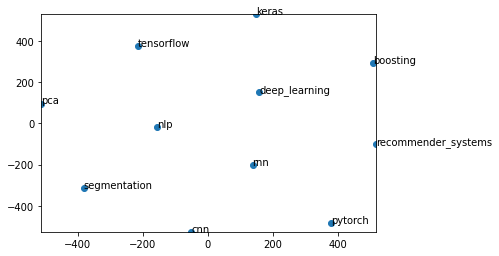

In [ ]:
def display_closestwords_tsnescatterplot(model, word):
    
    arr = np.empty((0,300), dtype='f')
    word_labels = [word]

    # get close words
    close_words = model.similar_by_word(word)
    
    # add the vector for each of the closest words to the array
    arr = np.append(arr, np.array([model[word]]), axis=0)
    for wrd_score in close_words:
        wrd_vector = model[wrd_score[0]]
        word_labels.append(wrd_score[0])
        arr = np.append(arr, np.array([wrd_vector]), axis=0)
        
    # find tsne coords for 2 dimensions
    tsne = TSNE(n_components=2, random_state=0)
    np.set_printoptions(suppress=True)
    Y = tsne.fit_transform(arr)

    x_coords = Y[:, 0]
    y_coords = Y[:, 1]
    # display scatter plot
    plt.scatter(x_coords, y_coords)

    for label, x, y in zip(word_labels, x_coords, y_coords):
        plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points')
    plt.xlim(x_coords.min()+0.00005, x_coords.max()+0.00005)
    plt.ylim(y_coords.min()+0.00005, y_coords.max()+0.00005)
    plt.show()

display_closestwords_tsnescatterplot(model, 'deep_learning')

# Creating Similarity Dataframe

In [ ]:
# Flattening the skills_list
all_skills_list.clear()
all_skills_list = [item for sublist in train_data_w2v_lst for item in sublist]
# Creating a set so that no list gets repeated
all_skills_list = list(set(all_skills_list))

# Creating a dataframe
simmilarity_df = pd.DataFrame(all_skills_list)
simmilarity_df.columns = ['Skill_1']
simmilarity_df["Skill_2"] = ""
simmilarity_df

,Skill_1,Skill_2
0,jquery,
1,airflow,
2,numpy,
3,julia,
4,undergraduate,
...,...,...
233,snowflake,
234,python,
235,rstudio,
236,optimization,


In [ ]:
# Adding all the similar skills received from word2vec in a dataframe
def create_simmilarity_df(dataframe, column):
  for index, skill_1 in enumerate(dataframe[column]):
    res = model.(skill_1)
  #return keywords
    dataframe['Skill_2'][index] = res

create_simmilarity_df(simmilarity_df, 'Skill_1')
# Displaying the dataframe
simmilarity_df

,Skill_1,Skill_2
0,jquery,"[(bootstrap, 0.9952071905136108), (restful, 0...."
1,airflow,"[(tensor, 0.9901267290115356), (user_interface..."
2,numpy,"[(random_forest, 0.9692010283470154), (bayes, ..."
3,julia,"[(chatbot, 0.9726875424385071), (bigquery, 0.9..."
4,undergraduate,"[(power_bi, 0.9354199171066284), (ba, 0.931241..."
...,...,...
233,snowflake,"[(sql, 0.9547601342201233), (linux, 0.94978356..."
234,python,"[(powerbi, 0.96990966796875), (optimization, 0..."
235,rstudio,"[(vba, 0.9947772026062012), (ab_testing, 0.990..."
236,optimization,"[(linux, 0.9793850183486938), (powerbi, 0.9747..."


In [ ]:
# Creating a new rows for all combinations of skills from w2v model
temp = simmilarity_df.apply(lambda x: pd.Series(x['Skill_2']), axis=1).stack().reset_index(level=1, drop=True)
temp.name = 'Skill_2'
simmilarity_df = simmilarity_df.drop(columns= ['Skill_2']).join(temp)
simmilarity_df['Skill_2'] = pd.Series(simmilarity_df['Skill_2'], dtype=object)

# Creating a new value for simmilarity
split_df_simi = pd.DataFrame(simmilarity_df['Skill_2'].tolist(), index=simmilarity_df.index)
simmilarity_df = simmilarity_df.drop(columns=["Skill_2"], axis=1)
simmilarity_df = pd.concat([simmilarity_df, split_df_simi], axis=1)
# Resetting the index
simmilarity_df = simmilarity_df.reset_index(drop=True) 
# Renaming the columns 
simmilarity_df.columns = ["Skill_1", "Skill_2", "Simmilarity/Correlation"]

simmilarity_df

,Skill_1,Skill_2,Simmilarity/Correlation
0,jquery,bootstrap,0.995207
1,jquery,restful,0.991315
2,jquery,salesforce,0.983317
3,jquery,github,0.978718
4,jquery,cryptography,0.978562
...,...,...,...
2375,linux,nodejs,0.950933
2376,linux,python,0.950623
2377,linux,snowflake,0.949784
2378,linux,lambda,0.946879


In [ ]:
# Saving only the simmilarity dataframe
simmilarity_df.to_csv("Simmilarity_df_JD.csv")

### Network Links Simmilarity Dataframe 

In [ ]:
# Reading the network_links datframe
# This dattaframe was downloaded from kaggle
links_df = pd.read_csv("/content/sample_data/stack_network_links.csv")
links_df.columns = ['Skill_2', 'Skill_1', 'Simmilarity/Correlation']
links_df.to_csv("Network_Links_dataframe_simmilarity.csv")

In [ ]:
# Concatinating thee simmilarity dataframe extracted from w2v model and network links 
all_simil_links = pd.concat([simmilarity_df, links_df], axis=0)
all_simil_links = all_simil_links.reset_index(drop=True) # Reset Index
all_simil_links.to_csv("All_skills_with_similarity_dataset.csv")
all_simil_links

,Skill_1,Skill_2,Simmilarity/Correlation
0,jquery,bootstrap,0.995207
1,jquery,restful,0.991315
2,jquery,salesforce,0.983317
3,jquery,github,0.978718
4,jquery,cryptography,0.978562
...,...,...,...
2865,xcode,objective-c,43.418825
2866,xcode,swift,48.620335
2867,xcode,iphone,34.712865
2868,xcode,ios,46.365091


# NetworkX Visualisation of the Similar Skills

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

G = nx.Graph()
G = nx.from_pandas_edgelist(all_simil_links, 'Skill_1', 'Skill_2')

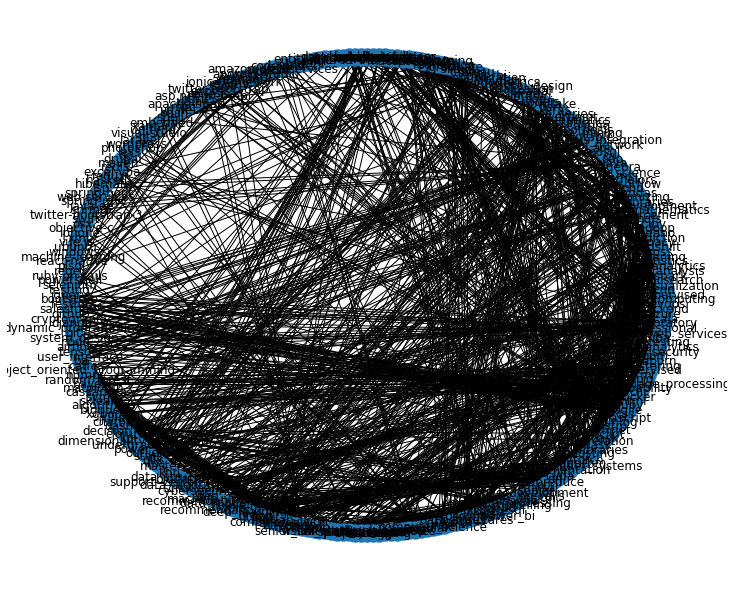

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(10, 8))
nx.draw_shell(G, with_labels=True)

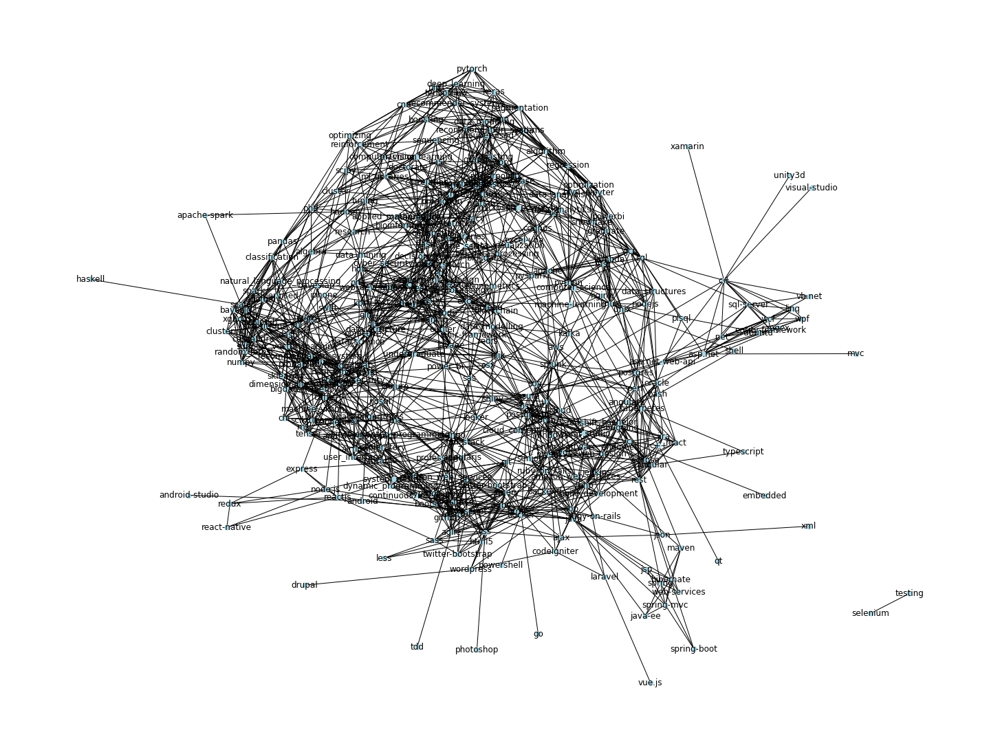

In [ ]:
from pylab import rcParams
rcParams['figure.figsize'] = 20, 15
pos = nx.spring_layout(G, scale=20, k=3/np.sqrt(G.order()))
d = dict(G.degree)
nx.draw(G, pos, node_color='lightblue', 
        with_labels=True, 
        nodelist=d, 
        node_size=50)

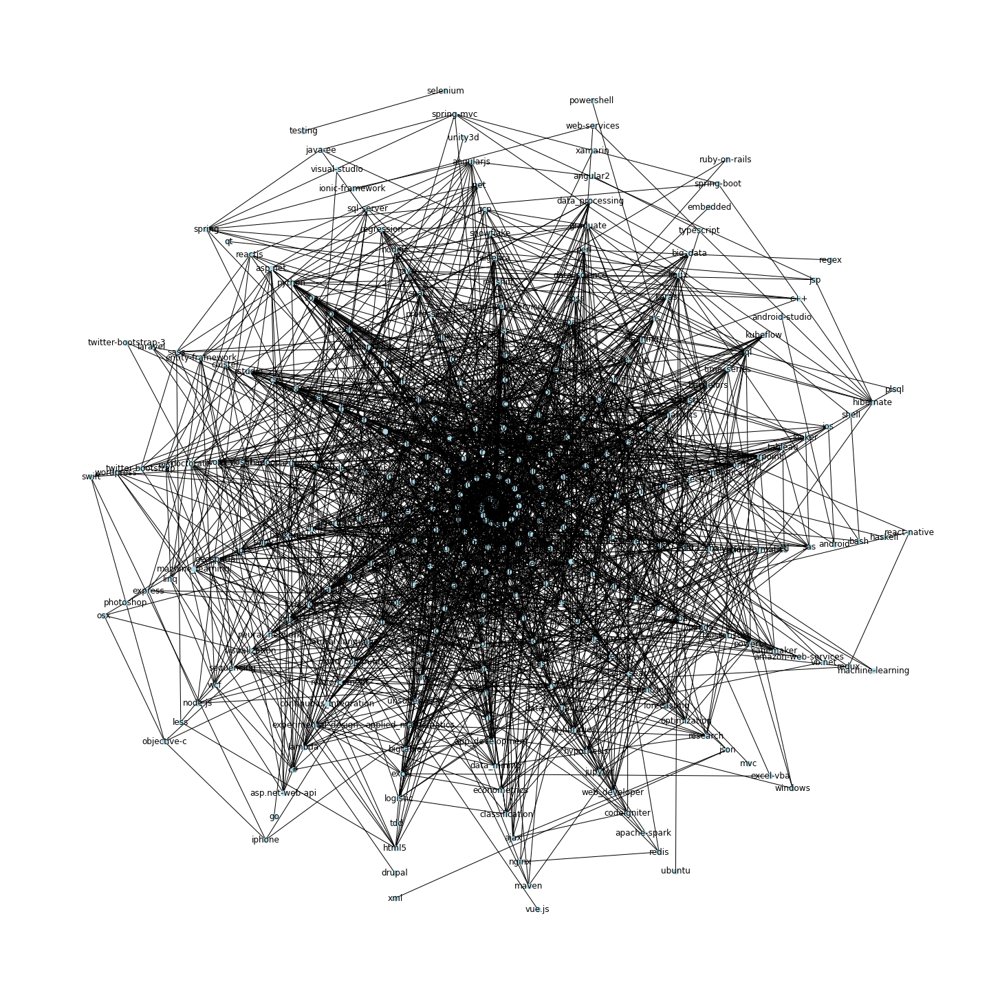

In [ ]:
from pylab import rcParams
rcParams['figure.figsize'] = 20, 20
pos = nx.spiral_layout(G)
d = dict(G.degree)
nx.draw(G, pos, node_color='lightblue', 
        with_labels=True, 
        nodelist=d, 
        node_size=50)

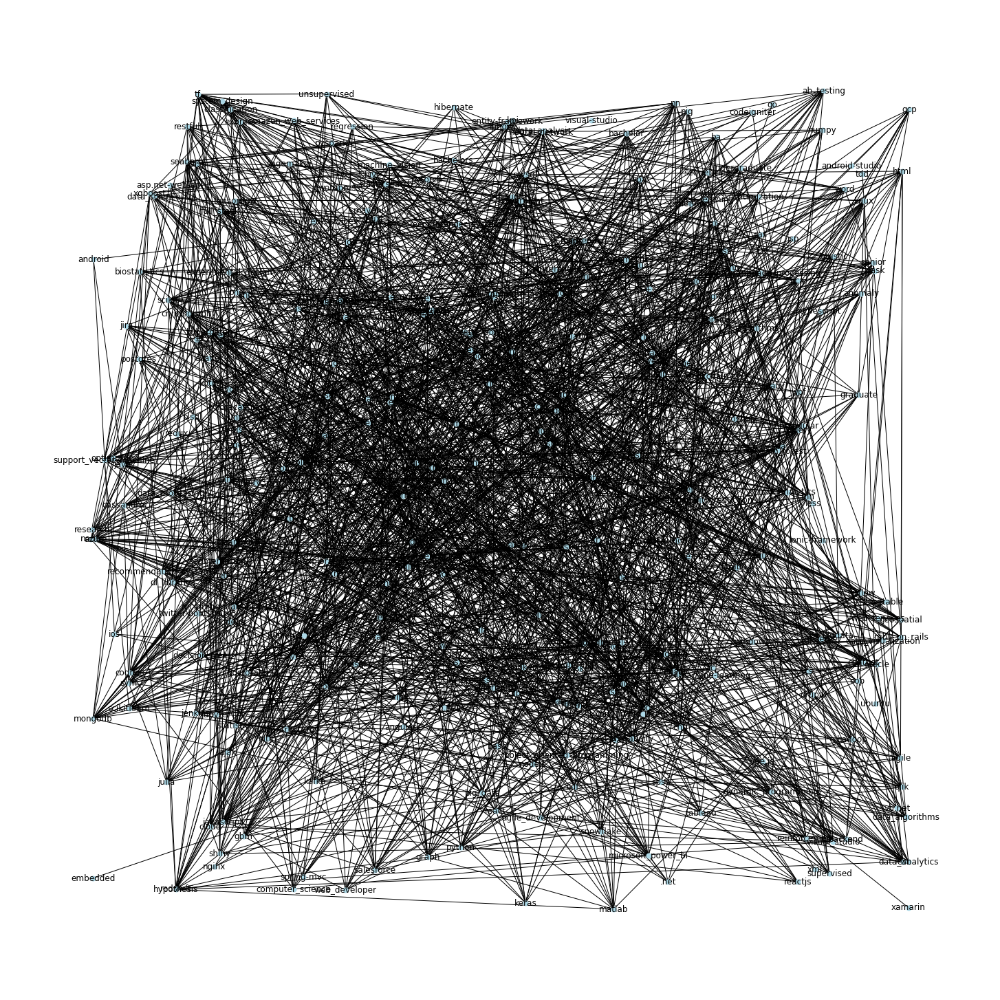

In [ ]:
rcParams['figure.figsize'] = 20, 20
pos = nx.random_layout(G)
d = dict(G.degree)
nx.draw(G, pos, node_color='lightblue', 
        with_labels=True, 
        nodelist=d, 
        node_size=50)

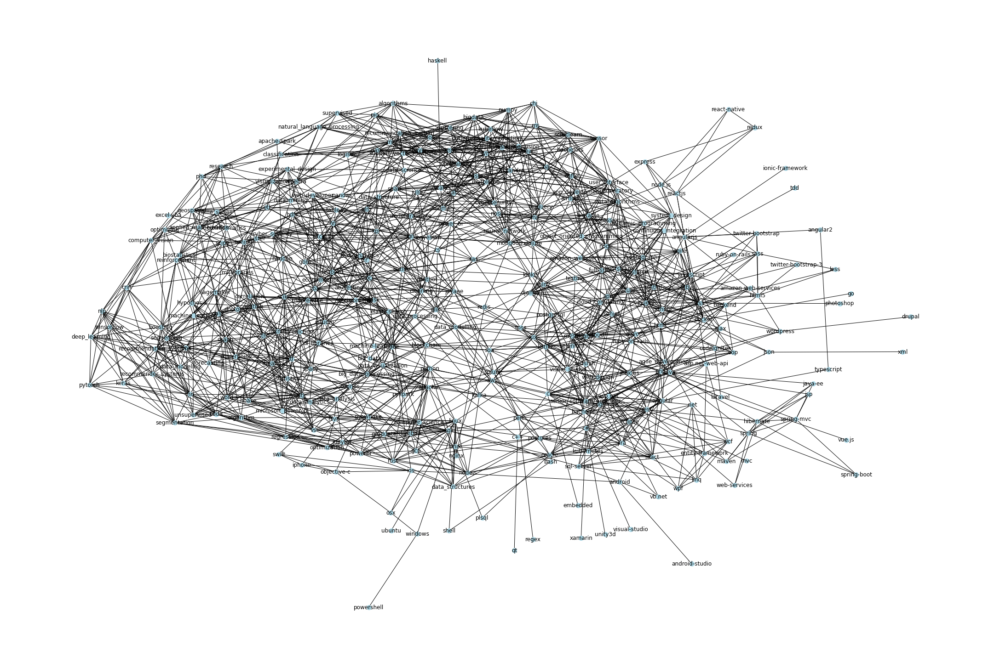

In [ ]:

rcParams['figure.figsize'] = 30, 20
pos = nx.kamada_kawai_layout(G)
d = dict(G.degree)
nx.draw(G, pos, node_color='lightblue', 
        with_labels=True, 
        nodelist=d, 
        node_size=100)

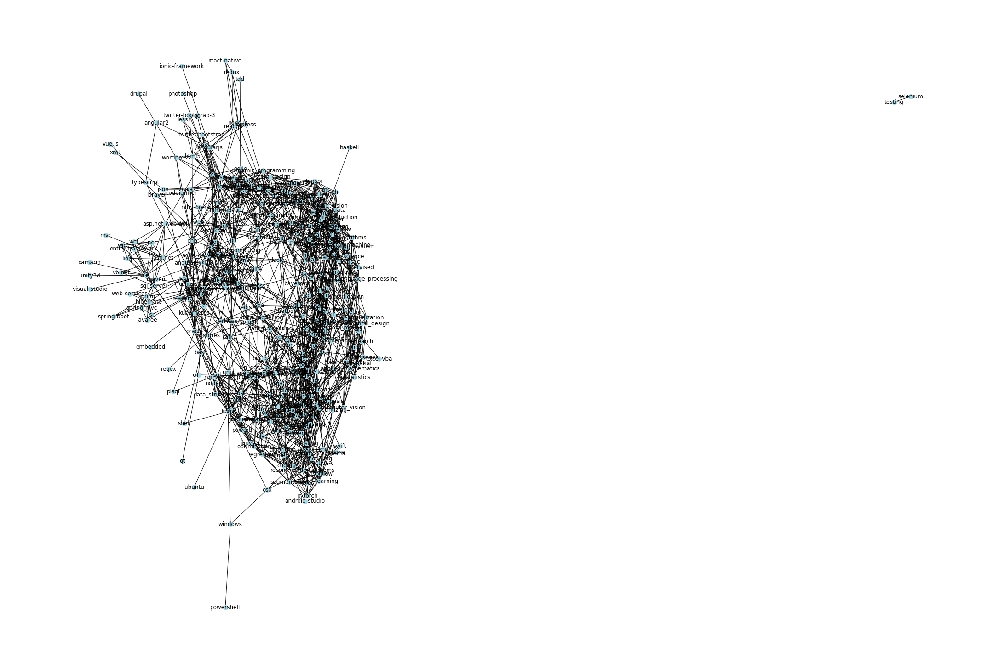

In [ ]:
rcParams['figure.figsize'] = 30, 20
pos = nx.spring_layout(G)
d = dict(G.degree)
nx.draw(G, pos, node_color='lightblue', 
        with_labels=True, 
        nodelist=d, 
        node_size=100)